<a href="https://colab.research.google.com/github/Patcharinee/AI_Interior_design/blob/main/AI_Interior_design.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Load the image encoder with CLIPVisionModelWithProjection.

Load a base model, scheduler, and the IP-Adapters.

In [3]:
import torch
from diffusers import AutoPipelineForImage2Image, DDIMScheduler, UniPCMultistepScheduler
from transformers import CLIPVisionModelWithProjection
from diffusers.utils import load_image, make_image_grid

image_encoder = CLIPVisionModelWithProjection.from_pretrained(
    "h94/IP-Adapter",
    subfolder="models/image_encoder",
    torch_dtype=torch.float16,
)

`torch_dtype` is deprecated! Use `dtype` instead!
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.53G [00:00<?, ?B/s]

In [4]:
!pip install -q controlnet-aux

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.4/290.4 kB 4.8 MB/s eta 0:00:00


Download model checkpoint

For study purpose, we use the InteriorDesignSuperMix from
https://civitai.com/models/85691/interiordesignsupermix
Note that you need to get an API token from the model page above to enter as an input in the next cell.

In [ ]:
############# download model checkpoint ##############################
import os
import getpass

# Prompt for credentials at runtime
token = input('Enter your token: ')

# Set for current session only
os.environ['DOWNLOAD_TOKEN'] = token

# Use in wget command
!wget -P /content/Checkpoints/ --content-disposition "https://civitai.com/api/download/models/93152?type=Model&format=SafeTensor&size=full&fp=fp16&token=$DOWNLOAD_TOKEN"


In [6]:

################ Download model with MLSD Controlnet #######################
import requests
import torch
from io import BytesIO
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from diffusers.utils import load_image, make_image_grid
from controlnet_aux import MLSDdetector

###################### model #######################
model_id = "/content/Checkpoints/interiordesignsuperm_v2.safetensors"
###############################################################


mlsd = MLSDdetector.from_pretrained('lllyasviel/ControlNet')

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-mlsd", torch_dtype=torch.float16)

pipeline = StableDiffusionControlNetPipeline.from_single_file(
     model_id,
     controlnet=controlnet,
     torch_dtype=torch.float16,
     image_encoder=image_encoder,
     safety_checker=None
 )

pipeline.scheduler = UniPCMultistepScheduler.from_config(pipeline.scheduler.config)
#pipeline.scheduler = DDIMScheduler.from_config(pipeline3.scheduler.config)
pipeline.load_ip_adapter(
  "h94/IP-Adapter",
  subfolder="models",
  weight_name="ip-adapter-plus_sd15.bin"
  #weight_name=["ip-adapter-plus_sd15.bin", "ip-adapter-plus-face_sd15.safetensors"]
)

pipeline.enable_model_cpu_offload()

# Move to GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"
#pipe.to(device)
generator3 = torch.Generator(device=device).manual_seed(3)



/usr/local/lib/python3.12/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/usr/local/lib/python3.12/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segmen

annotator/ckpts/mlsd_large_512_fp32.pth:   0%|          | 0.00/6.34M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


ip-adapter-plus_sd15.bin:   0%|          | 0.00/158M [00:00<?, ?B/s]

In [2]:
# Download Example room and style images
!git clone https://github.com/Patcharinee/AI_Interior_design_data.git /content/AI_Interior_design_data/

Cloning into '/content/AI_Interior_design_data'...
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 10 (delta 0), reused 10 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (10/10), 1.94 MiB | 18.21 MiB/s, done.


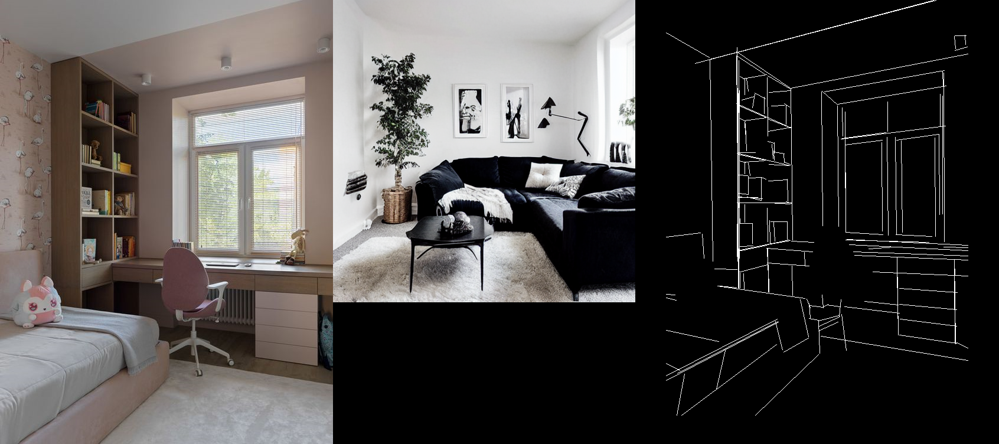

In [7]:
# load original room image
original_image = load_image("/content/AI_Interior_design_data/bedroom.png")
# load a style image to be used as a style reference image for redesigning the original room
style_image = load_image("/content/AI_Interior_design_data/black_sofa_scandi_living_room.png")
# generate an Mobile-optimized Line Segment Detection (MLSD) image to detect and preserve straight lines in the original room image.
mlsd_image = mlsd(original_image)
# display the original room, style image, and MLSD image
make_image_grid([original_image, style_image, mlsd_image], rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

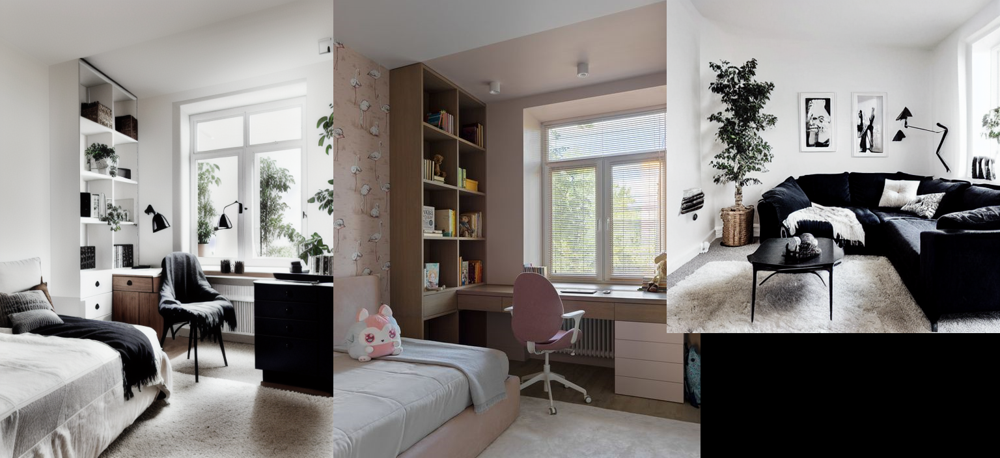

In [21]:
pipeline.set_ip_adapter_scale(0.8)
# Enter a text prompt
text_prompt="a cozy scandinvian style bed room with windows. best quality. high quality."
style_image = load_image("/content/AI_Interior_design_data/black_sofa_scandi_living_room.png")

# Enter Negative prompt
negative_prompt="monochrome, lowres, worst quality, low quality"
# generate image
#generator3 = torch.manual_seed(3)
new_image = pipeline(
    prompt=text_prompt,
    num_inference_steps=50,
    image=mlsd_image,
    ip_adapter_image=style_image,
    control_image=mlsd_image,
    #controlnet_conditioning_scale = 0.8, # (default = 0.5) — this parameter specifies how much weight to assign to the conditioning inputs.
    negative_prompt=negative_prompt,
    #guidance_scale=7.5, # (default = 7.5) — A higher guidance scale value encourages the model to generate images closely linked to the text prompt at the expense of lower image quality.
    #strength=0.6,
    num_images_per_prompt=1,
    #generator=generator3,
).images[0]

make_image_grid([new_image, original_image, style_image], rows=1, cols=3)

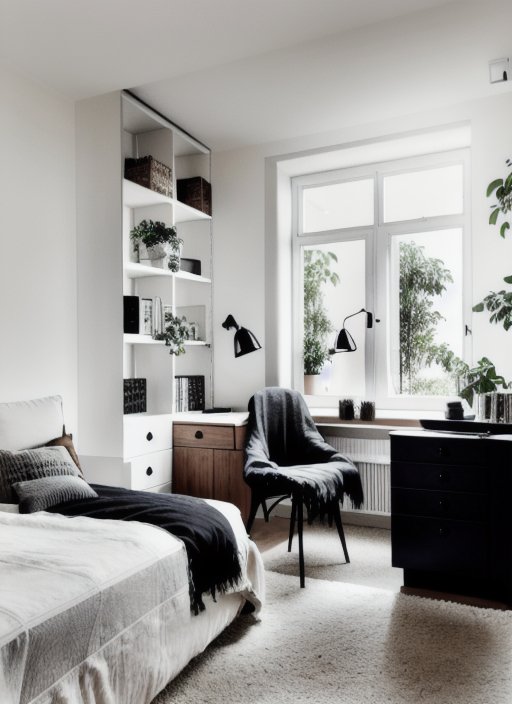

In [24]:
# save newly designed room output image
new_image.save("output.png")
redesigned_room = load_image("/content/output.png")
redesigned_room

  0%|          | 0/50 [00:00<?, ?it/s]

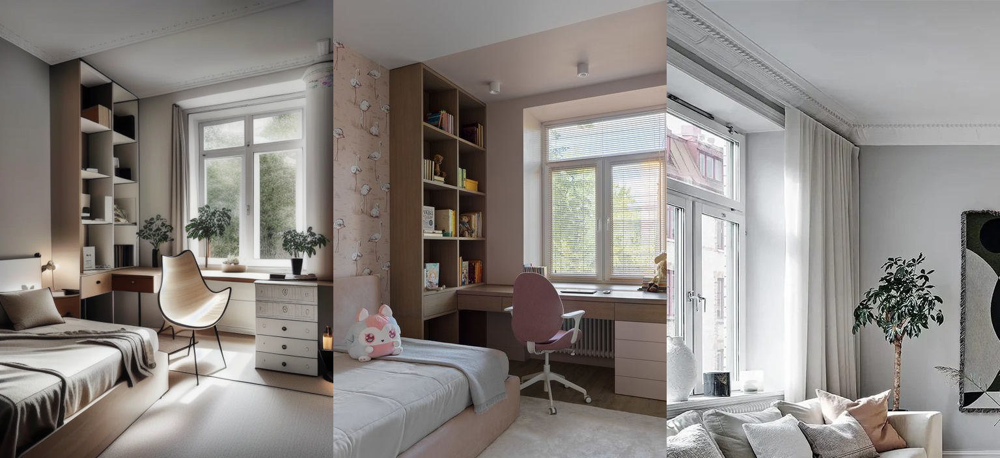

In [16]:
pipeline.set_ip_adapter_scale(0.8)
# Enter a text prompt
text_prompt="a cozy scandinvian style bed room with windows. best quality. high quality."
style_image = load_image("/content/AI_Interior_design_data/scandinavian_living_room2.jpg")

# Enter Negative prompt
negative_prompt="monochrome, lowres, worst quality, low quality"
# generate image
#generator3 = torch.manual_seed(3)
new_image = pipeline(
    prompt=text_prompt,
    num_inference_steps=50,
    image=mlsd_image,
    ip_adapter_image=style_image,
    control_image=mlsd_image,
    #controlnet_conditioning_scale = 0.8, # (default = 0.5) — this parameter specifies how much weight to assign to the conditioning inputs.
    negative_prompt=negative_prompt,
    #guidance_scale=7.5, # (default = 7.5) — A higher guidance scale value encourages the model to generate images closely linked to the text prompt at the expense of lower image quality.
    #strength=0.6,
    num_images_per_prompt=1,
    #generator=generator3,
).images[0]

make_image_grid([new_image, original_image, style_image], rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

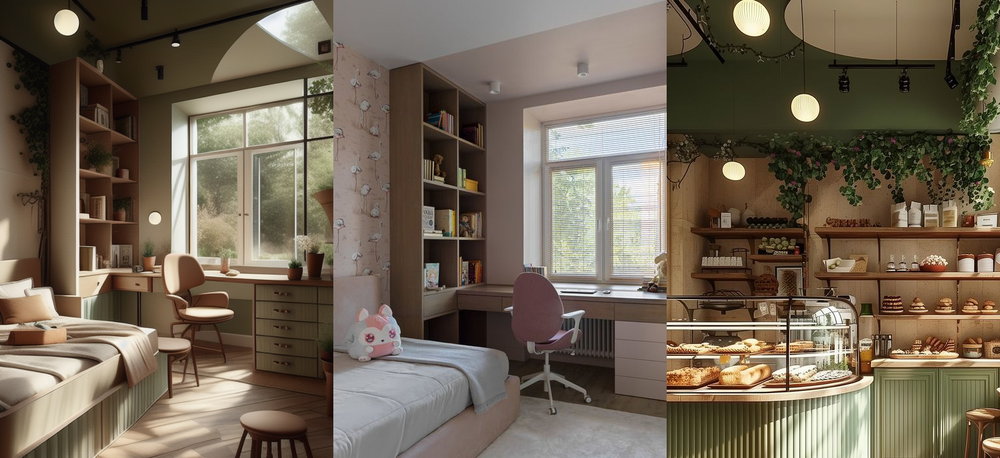

In [15]:
pipeline.set_ip_adapter_scale(0.8)
# Enter a text prompt
text_prompt="a cozy bed room with windows. best quality. high quality."
style_image = load_image("/content/AI_Interior_design_data/green_cafe.jpg")

# Enter Negative prompt
negative_prompt="monochrome, lowres, worst quality, low quality"
# generate image
#generator3 = torch.manual_seed(3)
new_image = pipeline(
    prompt=text_prompt,
    num_inference_steps=50,
    image=mlsd_image,
    ip_adapter_image=style_image,
    control_image=mlsd_image,
    #controlnet_conditioning_scale = 0.8, # (default = 0.5) — this parameter specifies how much weight to assign to the conditioning inputs.
    negative_prompt=negative_prompt,
    #guidance_scale=7.5, # (default = 7.5) — A higher guidance scale value encourages the model to generate images closely linked to the text prompt at the expense of lower image quality.
    #strength=0.6,
    num_images_per_prompt=1,
    #generator=generator3,
).images[0]

make_image_grid([new_image, original_image, style_image], rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

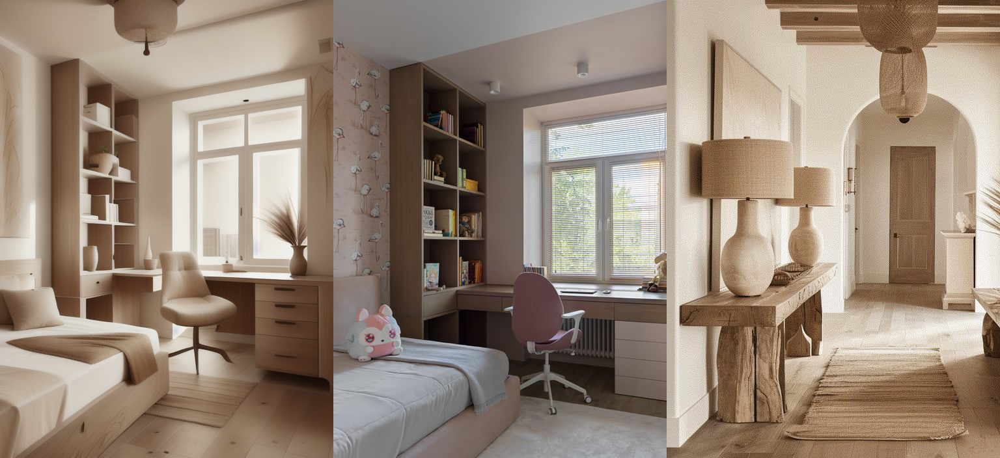

In [14]:
pipeline.set_ip_adapter_scale(0.8)
# Enter a text prompt
text_prompt="a cozy neutral bed room with windows. best quality. high quality."
style_image = load_image("/content/AI_Interior_design_data/wabi sabi.jpg")

# Enter Negative prompt
negative_prompt="monochrome, lowres, worst quality, low quality"
# generate image
#generator3 = torch.manual_seed(3)
new_image = pipeline(
    prompt=text_prompt,
    num_inference_steps=50,
    image=mlsd_image,
    ip_adapter_image=style_image,
    control_image=mlsd_image,
    #controlnet_conditioning_scale = 0.8, # (default = 0.5) — this parameter specifies how much weight to assign to the conditioning inputs.
    negative_prompt=negative_prompt,
    #guidance_scale=7.5, # (default = 7.5) — A higher guidance scale value encourages the model to generate images closely linked to the text prompt at the expense of lower image quality.
    #strength=0.6,
    num_images_per_prompt=1,
    #generator=generator3,
).images[0]

make_image_grid([new_image, original_image, style_image], rows=1, cols=3)

  0%|          | 0/50 [00:00<?, ?it/s]

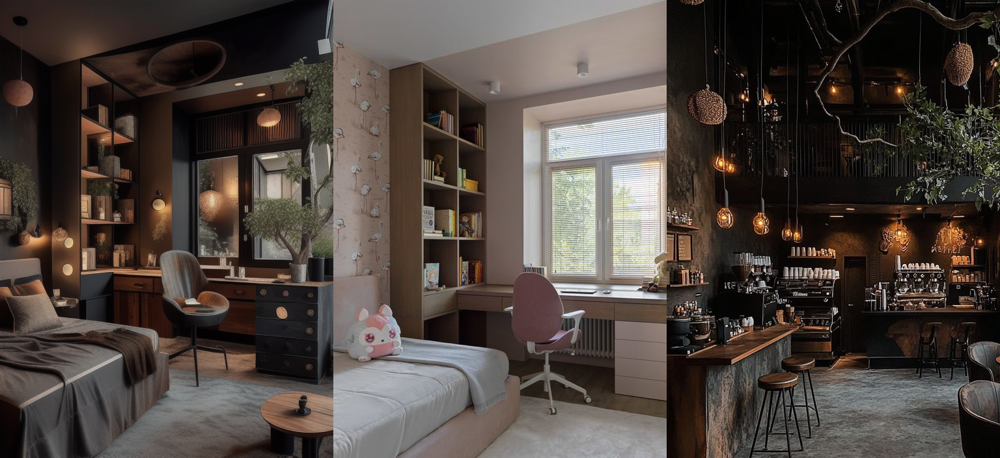

In [25]:
pipeline.set_ip_adapter_scale(0.8)
# Enter a text prompt
text_prompt="a cozy rustic bed room with windows. best quality. high quality."
style_image = load_image("/content/AI_Interior_design_data/black_rustic_cafe.jpg")

# Enter Negative prompt
negative_prompt="monochrome, lowres, worst quality, low quality"
# generate image
#generator3 = torch.manual_seed(3)
new_image = pipeline(
    prompt=text_prompt,
    num_inference_steps=50,
    image=mlsd_image,
    ip_adapter_image=style_image,
    control_image=mlsd_image,
    #controlnet_conditioning_scale = 0.8, # (default = 0.5) — this parameter specifies how much weight to assign to the conditioning inputs.
    negative_prompt=negative_prompt,
    #guidance_scale=7.5, # (default = 7.5) — A higher guidance scale value encourages the model to generate images closely linked to the text prompt at the expense of lower image quality.
    #strength=0.6,
    num_images_per_prompt=1,
    #generator=generator3,
).images[0]

make_image_grid([new_image, original_image, style_image], rows=1, cols=3)